# TASK 5

## OPEN IMAGES

In this sections we provide 2 functions to show the images and we open the 2 images villa and villa _img2

In [56]:
import cv2
import numpy as np 
from PIL import Image
import matplotlib.pyplot as plt

data_dir = 'data'

def plot_img(img_name):
    img = Image.open(f'{data_dir}/{img_name}')
    img = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    plt.figure(figsize=(15,15))
    plt.axis('off')
    plt.imshow(img[:,:,::-1])

def plot_img_2(img_name):
    img = cv2.cvtColor(np.array(img_name), cv2.COLOR_RGB2BGR)
    plt.figure(figsize=(15,15))
    plt.axis('off')
    plt.imshow(img[:,:,::-1])

def subplots(img1, img2 , figure_size = (20, 15)):
    fig, axes = plt.subplots(1, 2, figsize= figure_size)
    axes[0].imshow(img1)
    axes[0].axis('off')

    axes[1].imshow(img2)
    axes[1].axis('off')

    return fig

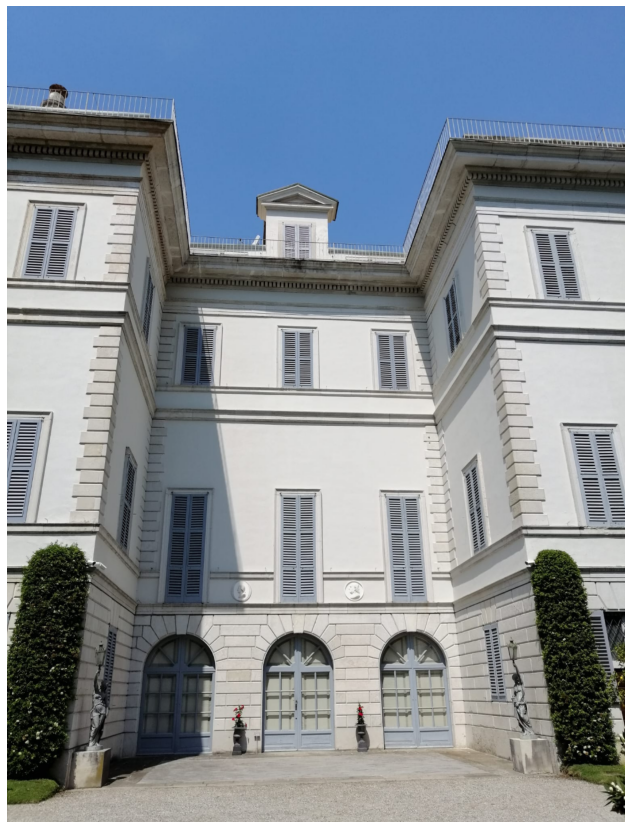

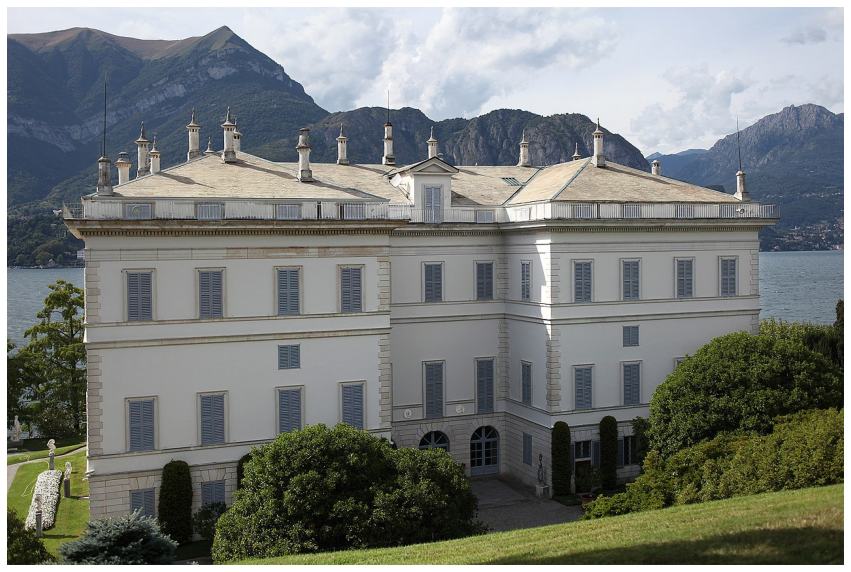

In [2]:
villa = cv2.imread(f"{data_dir}/villa.png")[:, :, ::-1]
villa_img2 = cv2.imread(f"{data_dir}/villa_img2.jpg")[:, :, ::-1]

plot_img('villa.png')
plot_img('villa_img2.jpg')

## FUNCTIONS FOR FEATURE EXTRAXTION AND MATCHING

In this section we have the functions to extract the features from images by using sift and to match the descriptors of the keypoints in 2 distinc images. This function does feature matching automatically by using Flann from OpenCv. 

In [3]:
def extract_and_select_sift_features(image, n_features):
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Initialize the SIFT detector
    sift = cv2.SIFT_create()

    # Detect SIFT keypoints and descriptors
    keypoints, descriptors = sift.detectAndCompute(gray_image, None)

    # Sort the keypoints by response (larger response indicates stronger keypoints)
    idx_response = np.argsort([-x.response for x in keypoints])[:n_features]
    selected_keypoints = [keypoints[i] for i in idx_response]
    selected_descriptors = descriptors[idx_response]

    # Draw the selected keypoints on the image
    image_with_keypoints = cv2.drawKeypoints(
        image, selected_keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    return image_with_keypoints, selected_keypoints, selected_descriptors


def match_descriptors(descriptor1, descriptor2, ratio=0.75):
    # Create a FLANN matcher
    matcher = cv2.FlannBasedMatcher_create()

    # Match descriptors using KNN with k=2
    matches = matcher.knnMatch(descriptor1, descriptor2, k=2)

    # Apply Lowe's Ratio Test
    good_matches = []
    for m, n in matches:
        if m.distance < ratio * n.distance:
            good_matches.append(m)

    return good_matches

In [14]:
###### ELIMINA QUESTA CELLA ######

import numpy as np
import cv2

def feature_matching(des1, des2, kp1, kp2, ratio_thresh=0.7):
    # Create a BFMatcher object
    bf = cv2.BFMatcher()

    # Match descriptors
    matches = bf.knnMatch(des1, des2, k=2)

    # Apply ratio test
    good_matches = []
    for m, n in matches:
        if m.distance < ratio_thresh * n.distance:
            good_matches.append(m)

    # Extract matching keypoints
    matched_kp1 = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    matched_kp2 = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    # Perform geometric verification using RANSAC
    if len(good_matches) > 4:
        # Estimate homography
        H, _ = cv2.findHomography(matched_kp1, matched_kp2, cv2.RANSAC, 5.0)
        
        # Warp keypoints from image 1 to image 2 using estimated homography
        warped_kp1 = cv2.perspectiveTransform(matched_kp1, H)
        
        # Calculate the error between warped keypoints and keypoints in image 2
        errors = np.sqrt(np.sum((warped_kp1 - matched_kp2) ** 2, axis=2))
        
        # Count inliers
        inliers = errors < 5.0  # You can adjust this threshold
        
        # Filter matches based on inliers
        inlier_matches = [good_matches[i] for i, d in enumerate(inliers) if d]
        
        # Final matched keypoints
        matched_kp1 = np.float32([kp1[m.queryIdx].pt for m in inlier_matches]).reshape(-1, 1, 2)
        matched_kp2 = np.float32([kp2[m.trainIdx].pt for m in inlier_matches]).reshape(-1, 1, 2)
        
    return matched_kp1, matched_kp2



## DISPLAY IMAGES FUNCTION

Here we have all the functions useful to display our intermediate and final results of the process. 

In particular, display_matches and display_matches_v2, are almost the same functions, indeed, they display the matches between the 2 images. The difference is that they handle different types of input formats for the keypoints matching. 

In the same spirit draw_epipolar_lines and draw_epipolar_lines_manually, solve the same task, namely plotting the final epipolar lines on the second image based on the keypoints of the first image, but they handle different input formats:
1. draw_epipolar_lines works on the keypoint matching generated by Flann matching
2. draw_epipolar_lines_manually works on the keypoint matching that were extracted manually from the 2 pictures

In [4]:
def display_matches(image1, keypoints1, image2, keypoints2, matches):
    # Create a new image that concatenates the two images side by side
    h1, w1 = image1.shape[:2]
    h2, w2 = image2.shape[:2]
    new_image = np.zeros((max(h1, h2), w1 + w2, 3), dtype=np.uint8)
    new_image[:h1, :w1] = image1
    new_image[:h2, w1:w1+w2] = image2

    # Draw lines between the matched keypoints
    for match in matches:
        img1_idx = match.queryIdx
        img2_idx = match.trainIdx
        (x1, y1) = keypoints1[img1_idx].pt
        (x2, y2) = keypoints2[img2_idx].pt
        cv2.line(new_image, (int(x1), int(y1)),
                 (int(x2) + w1, int(y2)), (255, 0, 0), 3)
    return new_image

In [50]:
def display_matches_v2(image1, matched_kp1, image2,  matched_kp2):
    # Create a new image that concatenates the two images side by side
    h1, w1 = image1.shape[:2]
    h2, w2 = image2.shape[:2]
    new_image = np.zeros((max(h1, h2), w1 + w2, 3), dtype=np.uint8)
    new_image[:h1, :w1] = image1
    new_image[:h2, w1:w1+w2] = image2

    # Draw lines between the matched keypoints
    for index in range(len(matched_kp1)):
        img1_idx = matched_kp1[index]
        img2_idx = matched_kp2[index]
        (x1, y1) = (img1_idx[0], img1_idx[1])
        (x2, y2) = (img2_idx[0], img2_idx[1])
        cv2.line(new_image, (int(x1), int(y1)),
                 (int(x2) + w1, int(y2)), (255, 0, 0), 3)
    return new_image

In [6]:
import matplotlib.pyplot as plt

def plot_image_with_points(image, points):

    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    for point in points:
        plt.scatter(point[0,0], point[0,1],  marker='o')

    plt.show()


In [7]:
def plot_points_with_labels(image, points, ax=None):
    
    if ax is None:
        fig, ax = plt.subplots()
    ax.imshow(image)
    ax.set_title('Points with Labels')
    ax.axis('on')  # Show axis for reference

    letters = 'abcdefghijklmnopqrstuvwxyz'
    
    for i, point in enumerate(points):
        label = i
        ax.plot(point[0], point[1], color='red', marker='o', markersize=3, label=label)
        ax.annotate(label, (point[0], point[1]), textcoords="offset points", xytext=(5,5), ha='center', color='red')
    
    if ax is None:
        plt.show()

In [9]:
def draw_epipolar_lines(image1, image2, keypoints1, keypoints2, fundamental_matrix):

    # keypoints2 = cv2.KeyPoint.convert(keypoints2)
    # keypoints1 = cv2.KeyPoint.convert(keypoints1)
    # Compute epipolar lines in image2 corresponding to keypoints in image1
    lines2 = cv2.computeCorrespondEpilines(
        keypoints1, 1, fundamental_matrix)
    lines2 = lines2.reshape(-1, 3)
    lines1 = cv2.computeCorrespondEpilines(
        keypoints2, 2, fundamental_matrix)
    lines1 = lines1.reshape(-1, 3)

    # Draw epipolar lines on image2
    image1_with_lines = image1.copy()
    image2_with_lines = image2.copy()
    for l1,l2,pt1, pt2 in zip(lines1,lines2,keypoints1, keypoints2):
        color = tuple(np.random.randint(0, 255, 3).tolist())

        x0, y0 = map(int, [0, -l2[2]/l2[1]])
        x1, y1 = map(int, [image2.shape[1], -(l2[0]*image2.shape[1]+l2[2])/l2[1]])
        image2_with_lines = cv2.line(
            image2_with_lines, (x0, y0), (x1, y1), color, 1)
        image2_with_lines = cv2.circle(
            image2_with_lines, pt2[0].astype(np.int32), 5, color, -1)
        x0, y0 = map(int, [0, -l1[2]/l1[1]])
        x1, y1 = map(int, [image1.shape[1], -(l1[0]*image1.shape[1]+l1[2])/l1[1]])
        image1_with_lines = cv2.line(
            image1_with_lines, (x0, y0), (x1, y1), color, 1)
        image1_with_lines = cv2.circle(
            image1_with_lines, pt1[0].astype(np.int32), 5, color, -1)

    return image1_with_lines, image2_with_lines


def draw_epipolar_lines_manually(image1, image2, keypoints1, keypoints2, fundamental_matrix):

    # keypoints2 = cv2.KeyPoint.convert(keypoints2)
    # keypoints1 = cv2.KeyPoint.convert(keypoints1)
    # Compute epipolar lines in image2 corresponding to keypoints in image1
    lines2 = cv2.computeCorrespondEpilines(
        keypoints1, 1, fundamental_matrix)
    lines2 = lines2.reshape(-1, 3)
    lines1 = cv2.computeCorrespondEpilines(
        keypoints2, 2, fundamental_matrix)
    lines1 = lines1.reshape(-1, 3)

    # Draw epipolar lines on image2
    image1_with_lines = image1.copy()
    image2_with_lines = image2.copy()
    for l1,l2,pt1, pt2 in zip(lines1,lines2,keypoints1, keypoints2):
        color = tuple(np.random.randint(0, 255, 3).tolist())

        #print(l1,l2, pt1, pt2)
        x0, y0 = map(int, [0, -l2[2]/l2[1]])
        x1, y1 = map(int, [image2.shape[1], -(l2[0]*image2.shape[1]+l2[2])/l2[1]])
        image2_with_lines = cv2.line(
            image2_with_lines, (x0, y0), (x1, y1), color, 1)
        image2_with_lines = cv2.circle(
            image2_with_lines, pt2.astype(np.int32), 5, color, -1)
        x0, y0 = map(int, [0, -l1[2]/l1[1]])
        x1, y1 = map(int, [image1.shape[1], -(l1[0]*image1.shape[1]+l1[2])/l1[1]])
        image1_with_lines = cv2.line(
            image1_with_lines, (x0, y0), (x1, y1), color, 1)
        image1_with_lines = cv2.circle(
            image1_with_lines, pt1.astype(np.int32), 5, color, -1)

    return image1_with_lines, image2_with_lines



## FUNDAMENTAL MATRIX ESTIMATION

This section is dedicated to the function which compute the Fundamental Matrix F. Instead of the 8 point Alg, we are going to use the FM_RANSAC options, since more robust and it allows to discard some outlier matching from the picture and keeping only the true matchings. This is done at the cost of providing at least 15 points instead of 8 as for the 8 point ALG.

Again the difference between compute_fundamental_matrix and compute_fundamental_matrix_manually is the same of functions described above.

In [10]:
def compute_fundamental_matrix(keypoints1, keypoints2, matches):
    # Extract corresponding points from the matches
    points1 = np.float32(
        [keypoints1[match.queryIdx].pt for match in matches]).reshape(-1, 1, 2)
    points2 = np.float32(
        [keypoints2[match.trainIdx].pt for match in matches]).reshape(-1, 1, 2)

    # Compute the fundamental matrix using 8 point algorithm 
    fundamental_matrix, mask = cv2.findFundamentalMat(
        points1, points2, cv2.FM_RANSAC)  #  Change FM_8POINT to FM_RANSAC or FM_LMEDS

    # Filter out outliers using the mask
    points1 = points1[mask.ravel() == 1]
    points2 = points2[mask.ravel() == 1]

    return fundamental_matrix, points1, points2


def compute_fundamental_matrix_manually(keypoints1, keypoints2):
    # Extract corresponding points from the matches
    points1 = np.float32(
        [point[0:2] for point in keypoints1])
    points2 = np.float32(
        [point[0:2] for point in keypoints2])
    
    #print(points1)

    # Compute the fundamental matrix using 8 point algorithm 
    fundamental_matrix, mask = cv2.findFundamentalMat(
        points1, points2, cv2.FM_RANSAC)  #  Change FM_8POINT to FM_RANSAC or FM_LMEDS

    # Filter out outliers using the mask
    points1 = points1[mask.ravel() == 1]
    points2 = points2[mask.ravel() == 1]

    return fundamental_matrix, points1, points2





In [118]:
###### ELIMINARE QUESTA CELLA #######


import numpy as np

def compute_fundamental_matrix_v2(correspondences):
    # Extract the points from correspondences
    points1 = correspondences[:, 0, :]
    points2 = correspondences[:, 1, :]

    # Normalize the points
    points1_normalized = normalize_points(points1)
    points2_normalized = normalize_points(points2)

    # Construct the A matrix
    A = construct_A_matrix(points1_normalized, points2_normalized)

    # Compute the singular value decomposition of A
    _, _, V = np.linalg.svd(A)

    # Extract the fundamental matrix from the last column of V
    F = V[-1].reshape(3, 3)

    # Enforce rank-2 constraint on F
    U, S, V = np.linalg.svd(F)
    S[-1] = 0
    F = U @ np.diag(S) @ V

    return F


def construct_A_matrix(points1, points2):
    num_points = points1.shape[0]
    A = np.zeros((num_points, 9))

    for i in range(num_points):
        x1, y1 = points1[i]
        x2, y2 = points2[i]
        A[i] = [x1 * x2, y1 * x2, x2, x1 * y2, y1 * y2, y2, x1, y1, 1]

    return A

def normalize_points(points):
    num_points = points.shape[0]
    normalized_points = np.zeros_like(points)

    for i in range(num_points):
        x, y = points[i]
        normalized_points[i] = [x / y, 1]

    return normalized_points
    

## SOLVE THE TASK

### FEATURE EXTRACTION (SIFT)

We start to solve the task by extracting from the 2 pictures the keypoints by using sift.

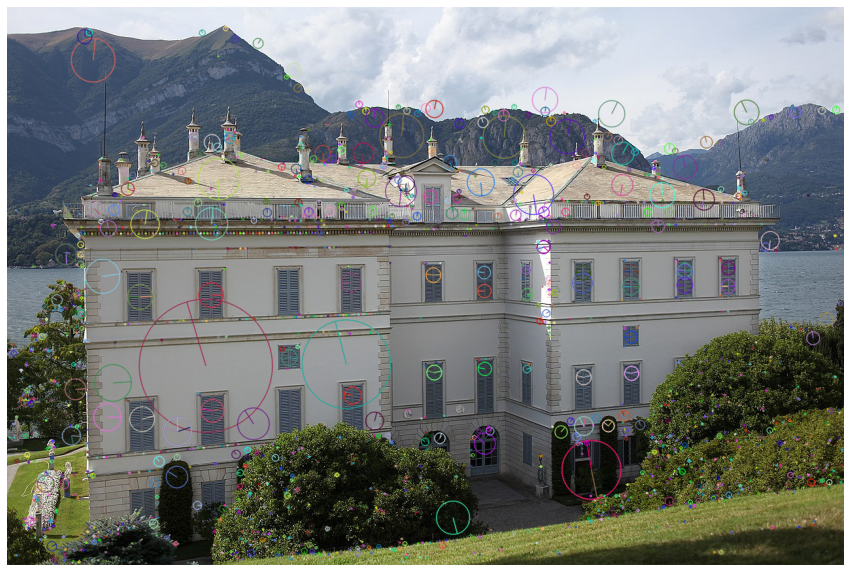

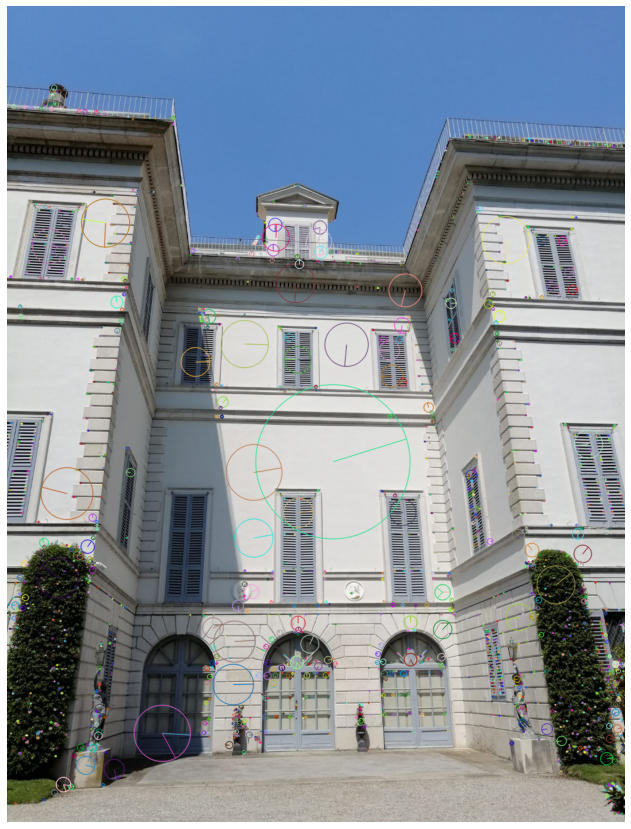

In [11]:
N_FEATURES = 2000

villa_sift, kpts1, descs1 = extract_and_select_sift_features(villa, N_FEATURES)
villa2_sift, kpts2,descs2 = extract_and_select_sift_features(villa_img2,N_FEATURES)

plot_img_2(villa2_sift)
plot_img_2(villa_sift)

### AUTOMATIC FEATURE MATCHING

Our first approach was to match automatically the features and then compute F on those. As we will see in this section, this was not successfully, indeed, the matching results to be imprecise. For example, the most common is that some windows in the first image are matched with different windows in the second image, thus we would get a bad reconstruction of F because of the many outliers.

In [29]:
matches = match_descriptors(descs1, descs2,ratio=0.73)

print(len(matches))


25


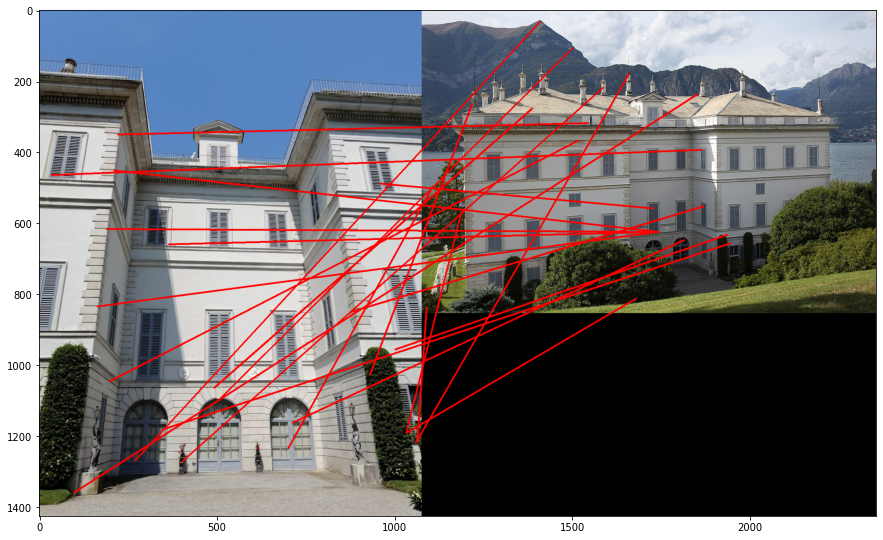

In [33]:
plt.figure(figsize=(15,15))
plt.imshow(
    display_matches(villa,kpts1,villa_img2,kpts2,matches)
)

# align keypoints according to the matches
m_kpts1 = [kpts1[m.trainIdx] for m in matches]
m_kpts2 = [kpts2[m.trainIdx] for m in matches]

As said before the matches are clearly wrong, but it is understandable, given the amount of similar details in the 2 pictures. It implies that the Fundamental matrix and the epipolar lines that we are going to obtain later are not reliable. For the sake of completeness we compute F and the epipolar lines using these matches, but this cannot be our correct final result.

Given what we said above, we decide to proceed by manually perfoming the matching in the 2 image in order to avoid too many outliers as in this case, and in the next section we are going to compute F properly using these matches.

In [34]:

fundamental_matrix, points1, points2 = compute_fundamental_matrix(kpts1, kpts2, matches)
print("Fundamental Matrix F:")
print(fundamental_matrix)

epi_img1, epi_img2 = draw_epipolar_lines(villa, villa_img2, points1, points2, fundamental_matrix)


Fundamental Matrix F:
[[ 4.68564251e-07 -4.89007941e-07  2.73924385e-04]
 [-2.34762676e-07  1.70772370e-06 -1.94164894e-03]
 [-2.58686411e-04 -6.63255879e-04  1.00000000e+00]]


In [38]:
print('Points remaing after Ransac:')
print(f'{len(points1)}, {len(points2)}\n')

for point in points1:
    print(point[0][0],point[0][1])    
   

Points remaing after Ransac:
10, 10

960.1839 488.70096
401.15018 1272.8514
401.15018 1272.8514
1003.87494 955.6986
1061.2024 1218.6388
190.87054 616.96277
348.4229 1180.7212
348.4229 1180.7212
932.97546 1025.2798
702.70245 1233.3707


<Figure size 1080x1080 with 0 Axes>

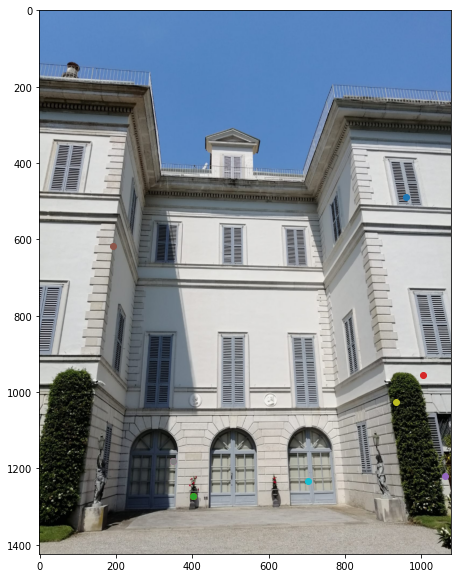

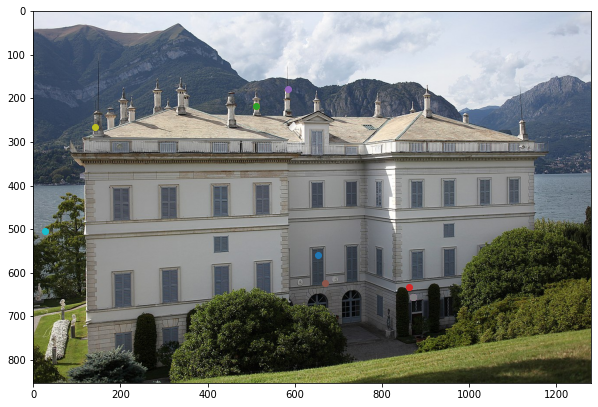

In [39]:
plt.figure(figsize=(15,15))
plot_image_with_points(villa, points1)
plot_image_with_points(villa_img2, points2)

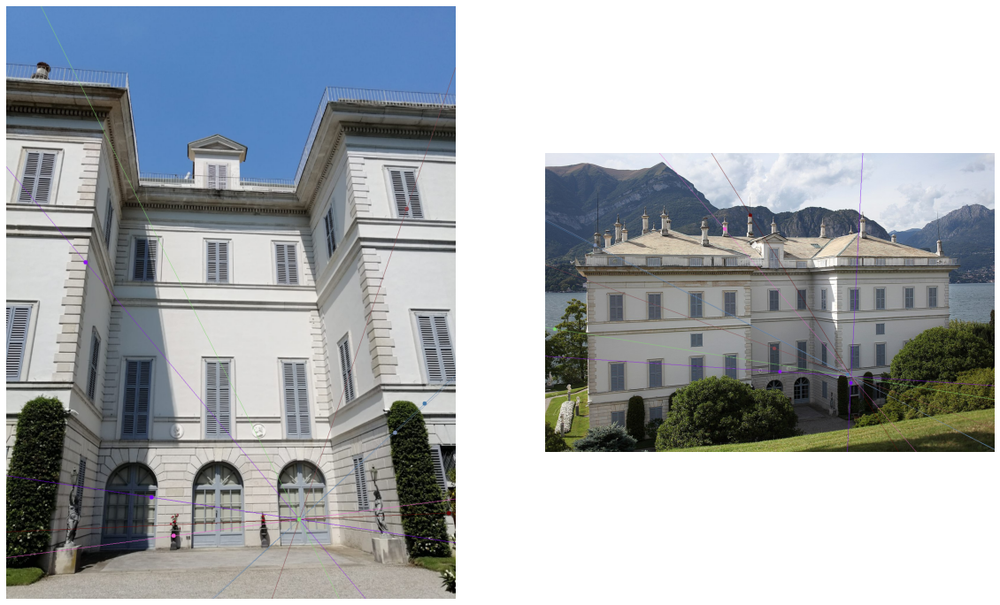

In [41]:
epipolar_lines = subplots(epi_img1, epi_img2)


### BY MANUALLY SELECTING THE POINTS

Now, we basically do the same of before but this time we manually selected 15 matching from the 2 images. To choose these points we used the sift results in order to try to pick couple of points which are keypoints in both images and we matched them.

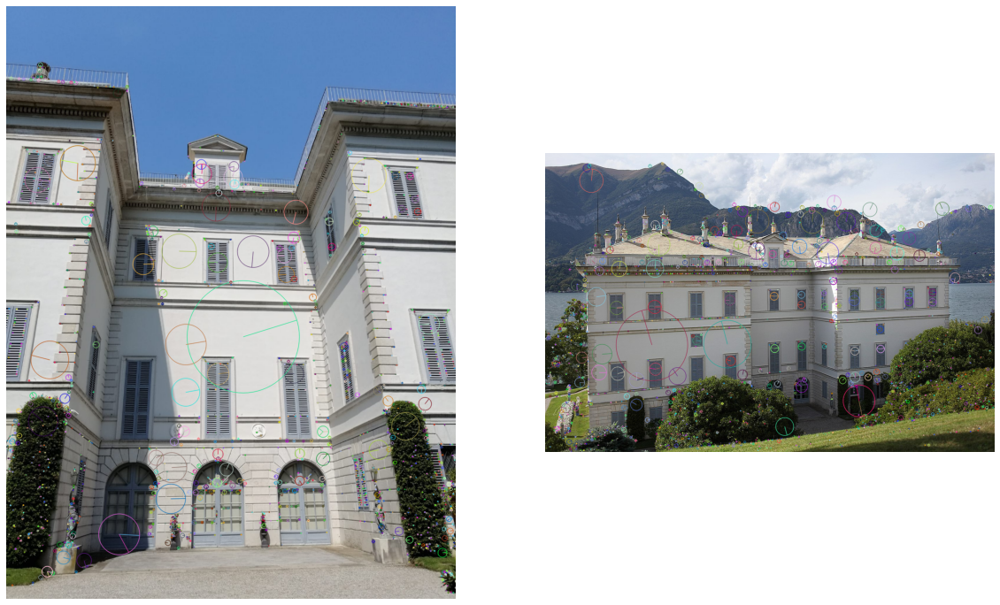

In [55]:
# Save the image as a PNG file
cv2.imwrite(f"{data_dir}/villa_sift.png", villa_sift[:, :, ::-1])
cv2.imwrite(f'{data_dir}/villa2_sift.png', villa2_sift[:, :, ::-1])



sift_result = subplots(villa_sift ,villa2_sift)


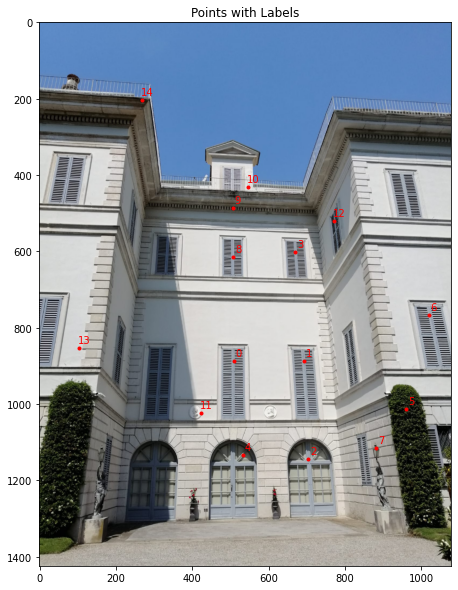

In [47]:
plt.rcParams['figure.figsize'] = (10, 10)

coordinates1 = np.loadtxt('coordinates/2024_04_04_19_20_30.txt')
plot_points_with_labels(villa, coordinates1)

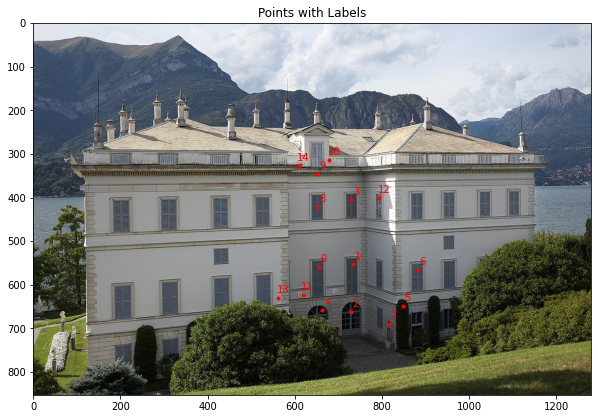

In [48]:
coordinates2 = np.loadtxt('coordinates/2024_04_04_19_29_08.txt')
plot_points_with_labels(villa_img2, coordinates2)

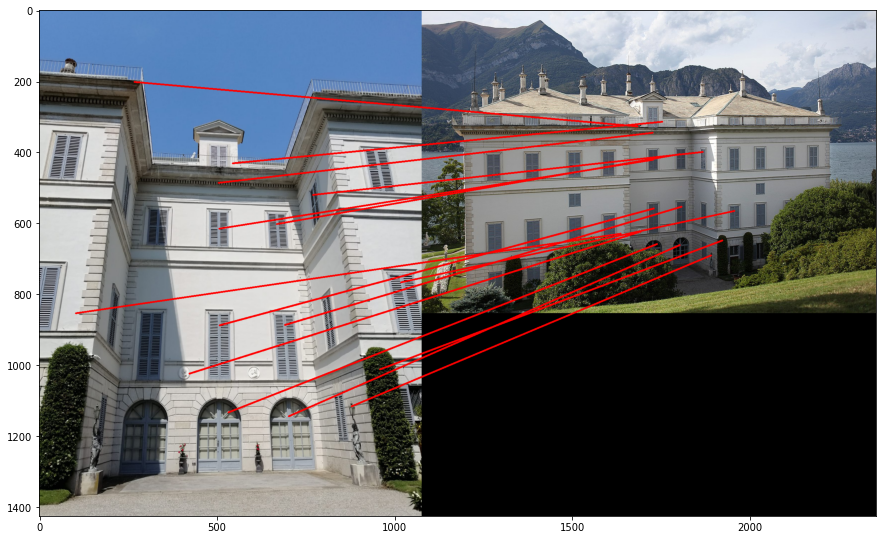

In [51]:
plt.figure(figsize=(15,15))
plt.imshow(
    display_matches_v2(villa,coordinates1,villa_img2,coordinates2)
)

In [52]:

fundamental_matrix, points1, points2 = compute_fundamental_matrix_manually(coordinates1, coordinates2)
print("Fundamental Matrix F:")
print(fundamental_matrix)


Fundamental Matrix F:
[[-3.80861130e-07  1.68268568e-06 -3.00939787e-03]
 [-2.13175955e-06  5.20488748e-07  1.95997446e-03]
 [ 2.23856328e-03 -1.99364479e-03  1.00000000e+00]]


Here we got the final F matrix and we can finally use it to compute the epipolar lines on image 2 by using F.

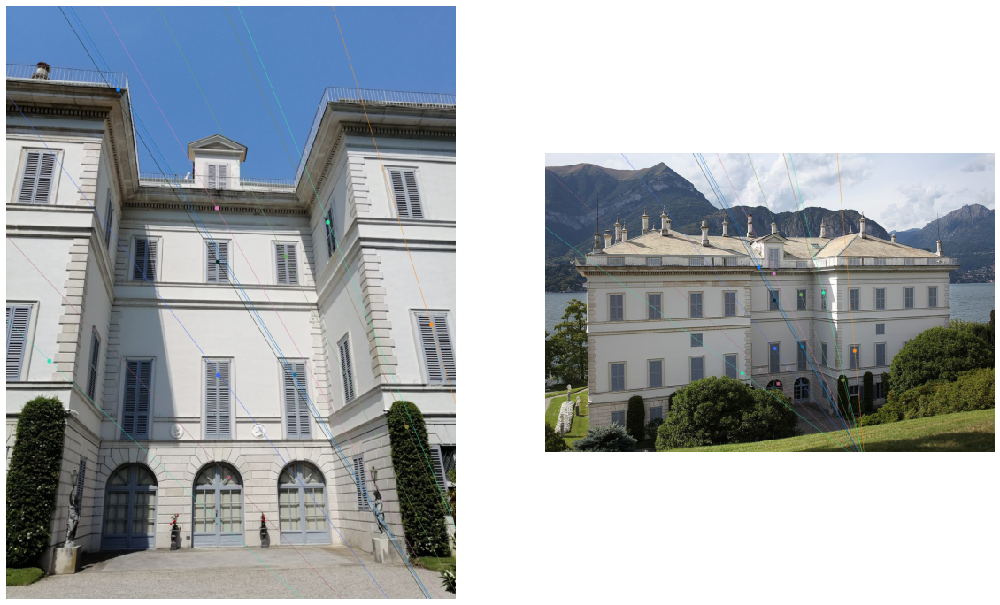

In [53]:
epi_img1, epi_img2 = draw_epipolar_lines_manually(villa, villa_img2, points1, points2, fundamental_matrix)
epipolar_plots = subplots(epi_img1, epi_img2)